For Week 7 - Asemic Writing, my goal is to create a similar style of writing that mimics the form and texture of the cursive script in Chinese, using [this article](https://www.xiewenyin.com/805.html) as an example. The following code is built on top of [Allison's Asemic writing with Flat notebook](https://github.com/aparrish/material-of-language/blob/master/flat-asemic-writing.ipynb) and the [Bezmerizing Demo Notebook](https://github.com/aparrish/bezmerizing/blob/master/demo.ipynb).

In [2]:
from flat import document, shape, rgba

In [3]:
from IPython.display import SVG, display
def show(page):
    display(SVG(page.svg()))

In [4]:
from bezmerizing import Polyline

In [5]:
import numpy as np

In [6]:
from numpy.random import uniform, normal, choice, randint

In [7]:
from scipy.stats import truncnorm
def t_normal(a, b, mu, sigma):
    tn = truncnorm((a-mu)/sigma, (b-mu)/sigma, loc=mu, scale=sigma)
    return tn.rvs(1)[0]

In [8]:
def make_char():
    pts = []
    for i in range(int(t_normal(4, 12, 8, 2))):
        x = (choice([0, 0.5, 1, 1.5]))
        y = (choice([0, 0.5, 1, 1.5]))
        pts.append([x, y])
    return Polyline(pts)

In [9]:
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return Polyline(pts)

In [10]:
thicknesses = (np.sin(np.linspace(0, np.pi*4, 100))+1) * 12

In [14]:
pts = [[np.random.normal(300, 100), np.random.normal(300, 100)] for i in range(6)]

In [15]:
poly = Polyline(pts).augment().fancy_curve(thicknesses=thicknesses, samples_per=54)

One thing I found fascinating in the Bezmerizing demo notebook is that, by using sin to add envelope to the thickness, it is possible to create a stroke that has a smooth, thin starting and ending, with a thick middle part.

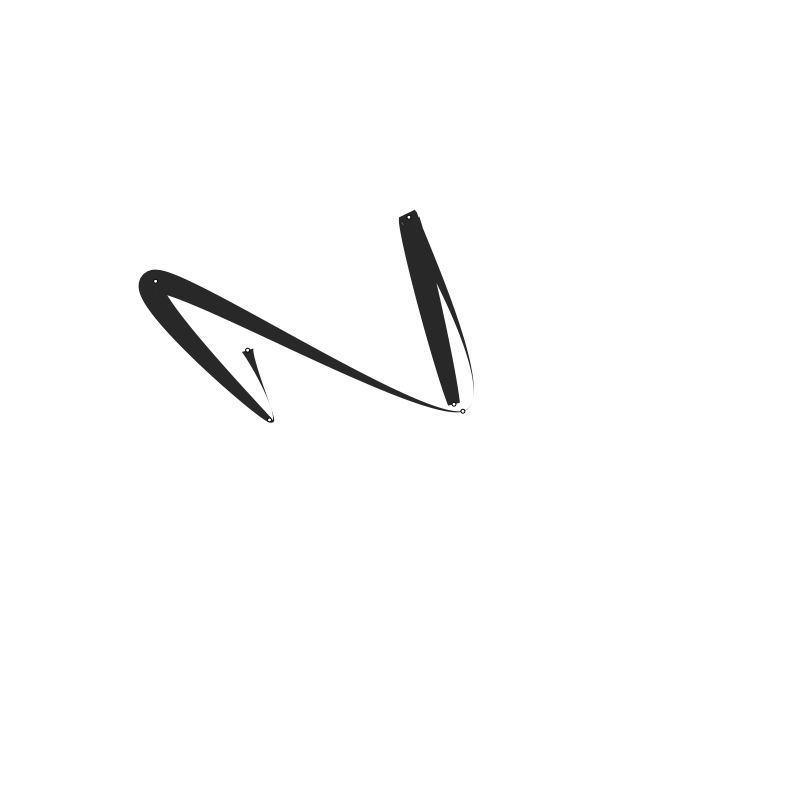

In [16]:
d = document(600, 600, 'pt')
page = d.addpage()
curve_fig = shape().fill(rgba(40, 40, 40, 255)).nostroke()
page.place(curve_fig.polygon(poly))

point_fig = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(255, 255, 255, 255)).width(1)
for pt in Polyline(pts).vertices:
    page.place(point_fig.circle(*pt, 2))
show(page)

So by adjusting the input radians of sin, we can somewhat create a single stroke that has a "down-stroke, move, up-stroke" feeling. And I'll use this as the baseline for creating strokes.


In [17]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 12

In [18]:
poly = Polyline(pts).augment().fancy_curve(thicknesses=thicknesses, samples_per=54)

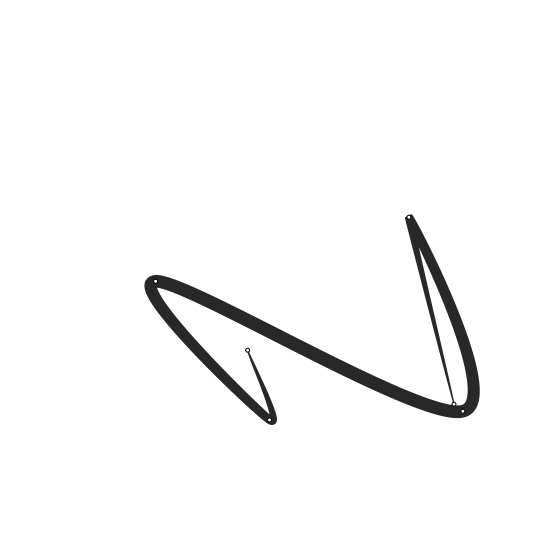

In [19]:
d = document(400, 400, 'pt')
page = d.addpage()
curve_fig = shape().fill(rgba(40, 40, 40, 255)).nostroke()
page.place(curve_fig.polygon(poly))

point_fig = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(255, 255, 255, 255)).width(1)
for pt in Polyline(pts).vertices:
    page.place(point_fig.circle(*pt, 2))
show(page)

Since Chinese characters consist of radicals, I used a make_radical function to create radicals on the left, right, top, and bottom, and used them as the building blocks.

In [20]:
def make_radical(x_norms, y_norms, num_pts_norms):
    pts = []
    for i in range(int(t_normal(*num_pts_norms))):
        x = t_normal(*x_norms)
        y = t_normal(*y_norms)
        pts.append([x, y])
    return Polyline(pts)    

In [21]:
left_radicals = [make_radical((0, 1, 0.25, 0.1), (0, 1, 0.5, 0.5), (2, 8, 4, 2)) for i in range(10)]
right_radicals = [make_radical((0, 1, 0.75, 0.1), (0, 1, 0.5, 0.5), (2, 8, 4, 2)) for i in range(10)]
top_radicals = [make_radical((0, 1, 0.5, 0.5), (0, 1, 0.25, 0.1), (2, 8, 4, 2)) for i in range(10)]
bottom_radicals = [make_radical((0, 1, 0.5, 0.5), (0, 1, 0.75, 0.1), (2, 8, 4, 2)) for i in range(10)]

In [22]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
# poly = Polyline(scaled_pts).augment().fancy_curve(thicknesses=thicknesses, samples_per=54)

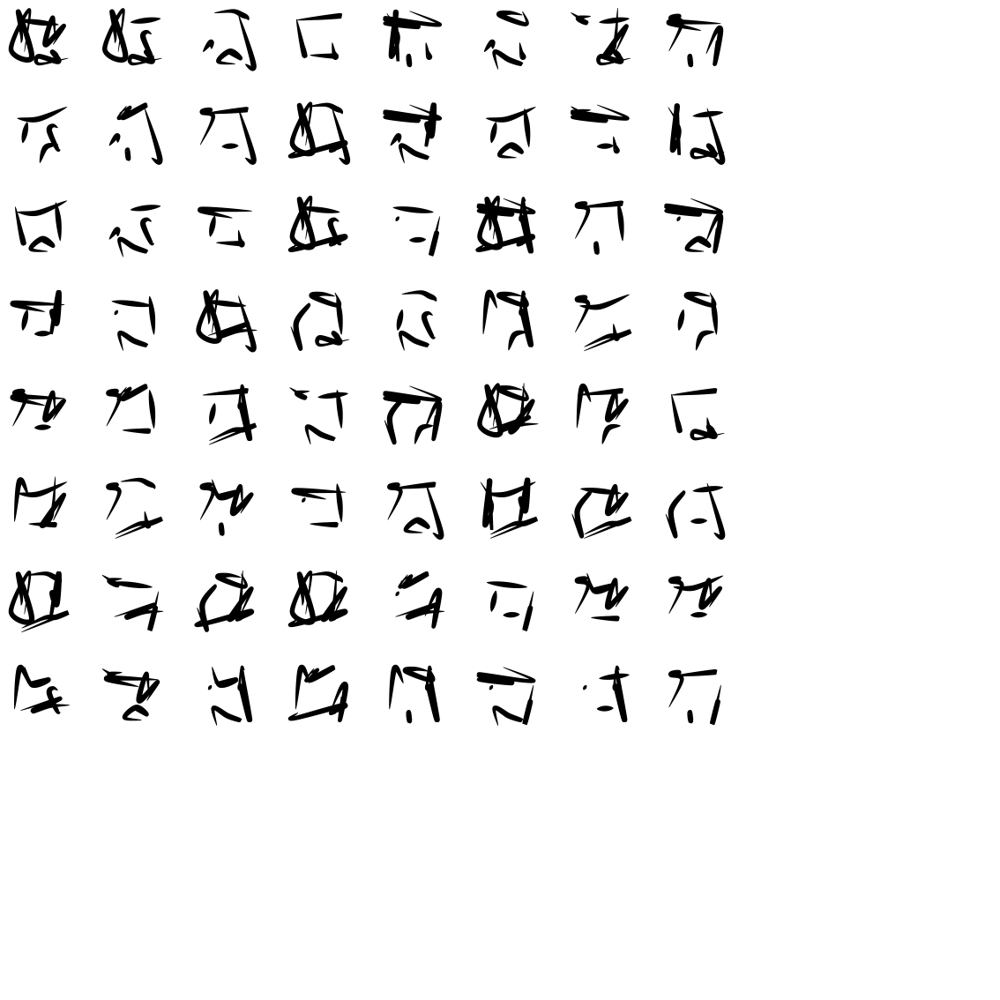

In [251]:
size = 300
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 255))
grid_n = 8
grid_size = size / grid_n
for i in range(grid_n):
    for j in range(grid_n):
        radical_pline = choice(left_radicals).scale(grid_size * 0.67).translate(3 + i * grid_size, 3 + j * grid_size)
        poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses)
        poly = figure.polygon(poly)
        page.place(poly)
        radical_pline = choice(right_radicals).scale(grid_size * 0.67).translate(3 + i * grid_size, 3 + j * grid_size)
        poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses)
        poly = figure.polygon(poly)
        page.place(poly)
        radical_pline = choice(top_radicals).scale(grid_size * 0.67).translate(3 + i * grid_size, 3 + j * grid_size)
        poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses)
        poly = figure.polygon(poly)
        page.place(poly)
        radical_pline = choice(bottom_radicals).scale(grid_size * 0.67).translate(3 + i * grid_size, 3 + j * grid_size)
        poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses)
        poly = figure.polygon(poly)
        page.place(poly)
show(page)

The result is interesting, but they aren't quite look like characters, since:
1. They somewhat overlaps too much
2. The rapitition rate is a little too high
3. We are missing stand-alone radicals
4. Radicals are made of only one polyline
5. The composition of each character are identical.

So I made an adjustment to try to control the bounding box of each type of radicals, instead of controling the center point of the normal districution in the generation:

In [183]:
left_radicals = [make_radical((0, 0.7, 0.2, 0.1), (0, 1, 0.5, 0.5), (2, 8, 4, 2)) for i in range(10)]
right_radicals = [make_radical((0.3, 1, 0.8, 0.1), (0, 1, 0.5, 0.5), (2, 8, 4, 2)) for i in range(10)]
top_radicals = [make_radical((0, 1, 0.5, 0.5), (0, 0.7, 0.2, 0.1), (2, 8, 4, 2)) for i in range(10)]
bottom_radicals = [make_radical((0, 1, 0.5, 0.5), (0.3, 1, 0.8, 0.1), (2, 8, 4, 2)) for i in range(10)]

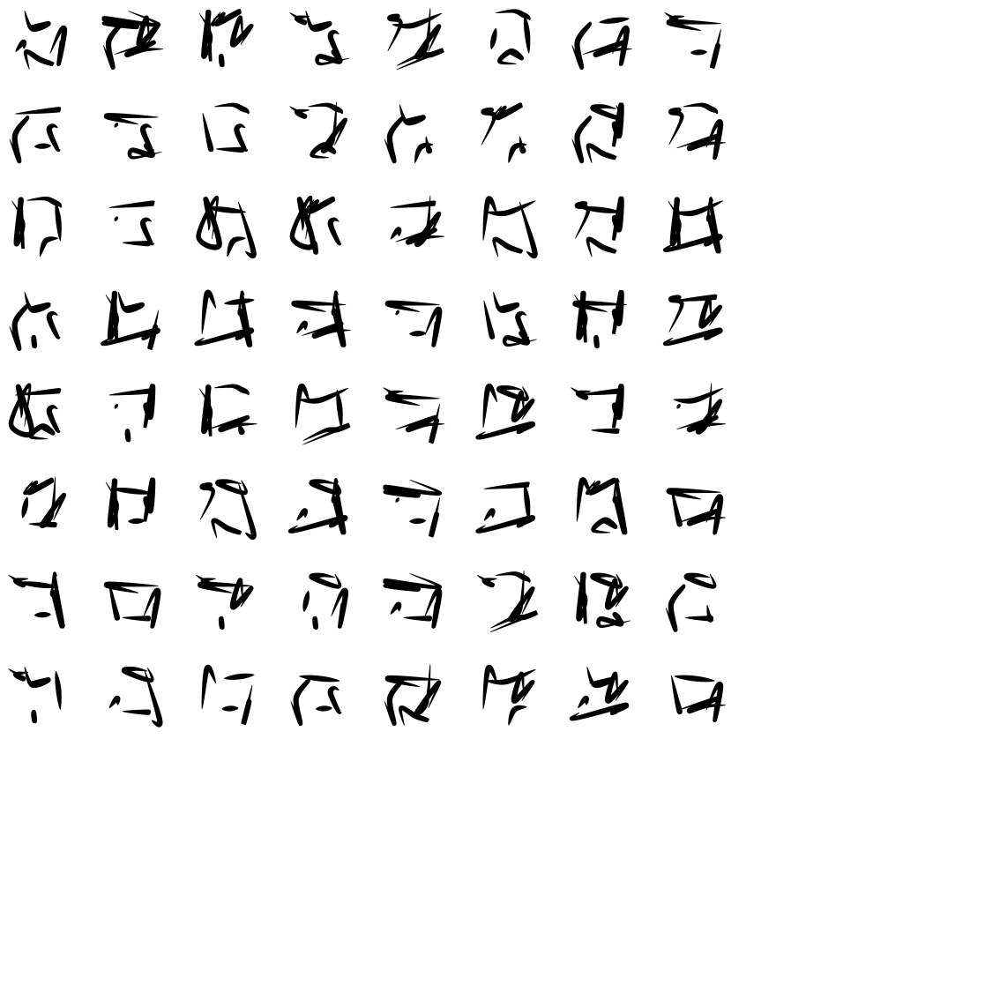

In [252]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 300
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 255))
grid_n = 8
grid_size = size / grid_n
for i in range(grid_n):
    for j in range(grid_n):
        radical_pline = choice(left_radicals).scale(grid_size * 0.67).translate(3 + i * grid_size, 3 + j * grid_size)
        poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses)
        poly = figure.polygon(poly)
        page.place(poly)
        radical_pline = choice(right_radicals).scale(grid_size * 0.67).translate(3 + i * grid_size, 3 + j * grid_size)
        poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses)
        poly = figure.polygon(poly)
        page.place(poly)
        radical_pline = choice(top_radicals).scale(grid_size * 0.67).translate(3 + i * grid_size, 3 + j * grid_size)
        poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses)
        poly = figure.polygon(poly)
        page.place(poly)
        radical_pline = choice(bottom_radicals).scale(grid_size * 0.67).translate(3 + i * grid_size, 3 + j * grid_size)
        poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses)
        poly = figure.polygon(poly)
        page.place(poly)
show(page)

Then try to create stand-alone radicals with multiple strokes, and create copies of them that can be used in combinations with other radicals.


In [26]:
def make_radical_multi(x_norms, y_norms, num_pts_norms, num_strokes):
    p_lines = []
    for i in range(num_strokes):
        pts = []
        for i in range(int(t_normal(*num_pts_norms))):
            x = t_normal(*x_norms)
            y = t_normal(*y_norms)
            pts.append([x, y])
        p_lines.append(Polyline(pts))
    
    return p_lines

In [27]:
def scale_shift_radical_multi(p_lines, scale, x_off, y_off):
    new_p_lines = []
    for p_line in p_lines:
        new_p_lines.append(p_line.scale(scale).translate(x_off, y_off))
    return new_p_lines    

In [28]:
sa_center_multi = [make_radical_multi((0.1, 0.9, 0.5, 0.5), (0.1, 0.9, 0.5, 0.5), (2, 8, 4, 2), randint(1, 4)) for i in range(8)]
# sa_left_radicals_multi = [make_radical_multi((0, 0.8, 0.4, 0.5), (0.2, 1, 0.6, 0.5), (2, 8, 4, 2), randint(1, 3)) for i in range(16)]
# sa_right_radicals_multi = [make_radical_multi((0.3, 1, 0.65, 0.5), (0, 1, 0.7, 0.5), (2, 8, 4, 2), randint(1, 3)) for i in range(16)]
# sa_top_radicals_multi = [make_radical_multi((0, 1, 0.5, 0.5), (0, 0.7, 0.2, 0.5), (2, 8, 4, 2), randint(1, 3)) for i in range(16)]
# sa_bottom_radicals_multi = [make_radical_multi((0, 1, 0.5, 0.5), (0.3, 1, 0.8, 0.5), (2, 8, 4, 2), randint(1, 3)) for i in range(16)]
sa_left_radicals_multi = [scale_shift_radical_multi(sa, 0.9, -0.1, 0) for sa in sa_center_multi]
sa_right_radicals_multi = [scale_shift_radical_multi(sa, 0.9, 0.1, 0) for sa in sa_center_multi]
sa_top_radicals_multi = [scale_shift_radical_multi(sa, 0.9, 0, -0.1) for sa in sa_center_multi]
sa_bottom_radicals_multi = [scale_shift_radical_multi(sa, 0.9, 0, 0.1) for sa in sa_center_multi]

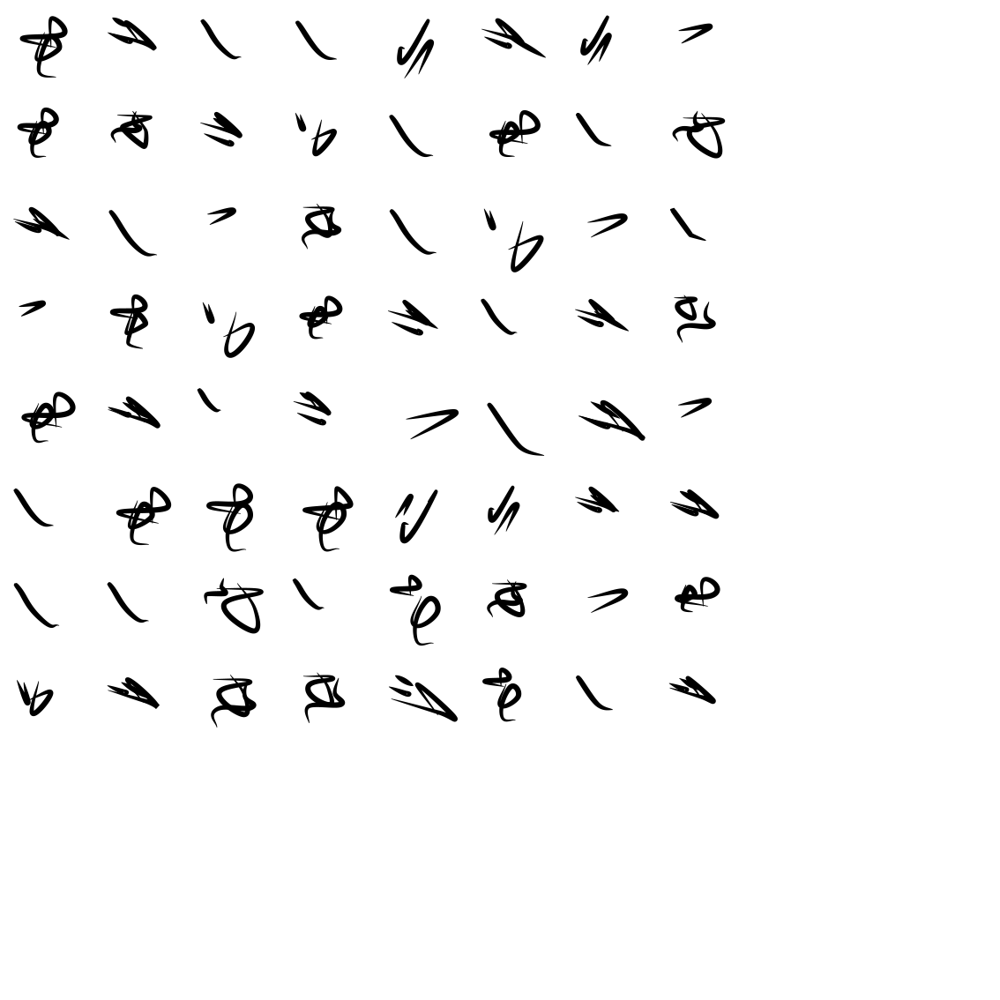

In [275]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 300
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 255))
grid_n = 8
grid_size = size / grid_n
for i in range(grid_n):
    for j in range(grid_n):
        radical_multi_strokes = sa_center_multi[choice(len(sa_center_multi)-1)]
        for stroke in radical_multi_strokes:
            radical_pline = stroke.scale(grid_size * normal(0.67, 0.15)).translate(3 + i * grid_size, 3 + j * grid_size)
            tightness = normal(-0.5, 0.5)
#             print(radical_pline.augment().catmull_spline(tightness).beziers)
            poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=tightness)
            poly = figure.polygon(poly)
            page.place(poly)
        
show(page)

Then to use combinations to make chars:
1. one radical: sa_center
2. combinations of two radicals: left + sa_right, sa_left + right, top + sa_bottom, sa_top + bottom
3. combinations of three radicals: top + left + sa_right, top + sa_left + right, left + sa_right + bottom, sa_left + right + bottom

In [33]:
def make_char_1():
    return choice(sa_center_multi)

def make_char_2():
    comb = randint(0, 4)
    switcher = {
                0: [choice(left_radicals)] + choice(sa_right_radicals_multi),
                1: choice(sa_left_radicals_multi) + [choice(right_radicals)],
                2: [choice(top_radicals)] + choice(sa_bottom_radicals_multi),
                3: choice(sa_top_radicals_multi) + [choice(bottom_radicals)]
                }
    return switcher.get(comb)

def make_char_3():
    comb = randint(0, 4)
    switcher = {
                0: [choice(top_radicals)] + [choice(left_radicals)] + choice(sa_right_radicals_multi),
                1: [choice(top_radicals)] + choice(sa_left_radicals_multi) + [choice(right_radicals)],
                2: [choice(left_radicals)] + choice(sa_right_radicals_multi) + [choice(bottom_radicals)],
                3: choice(sa_left_radicals_multi) + [choice(right_radicals)] + [choice(bottom_radicals)]
                }
    return switcher.get(comb)

Chars with a single radical:

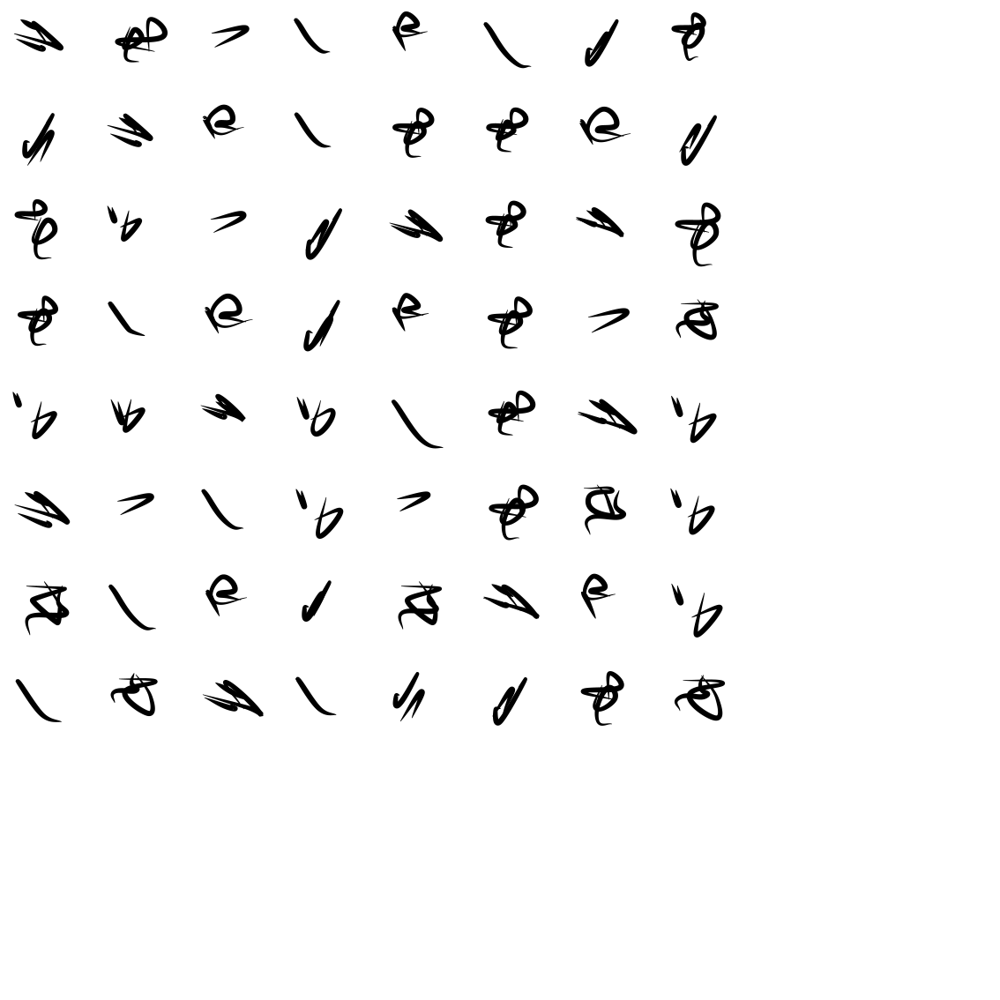

In [276]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 300
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 255))
grid_n = 8
grid_size = size / grid_n
for i in range(grid_n):
    for j in range(grid_n):
        char_multi_strokes = make_char_1()
#         print(char_multi_strokes)
        for stroke in char_multi_strokes:
            radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(3 + i * grid_size, 3 + j * grid_size)
            poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
            poly = figure.polygon(poly)
            page.place(poly)
        
show(page)

Chars with two radicals:

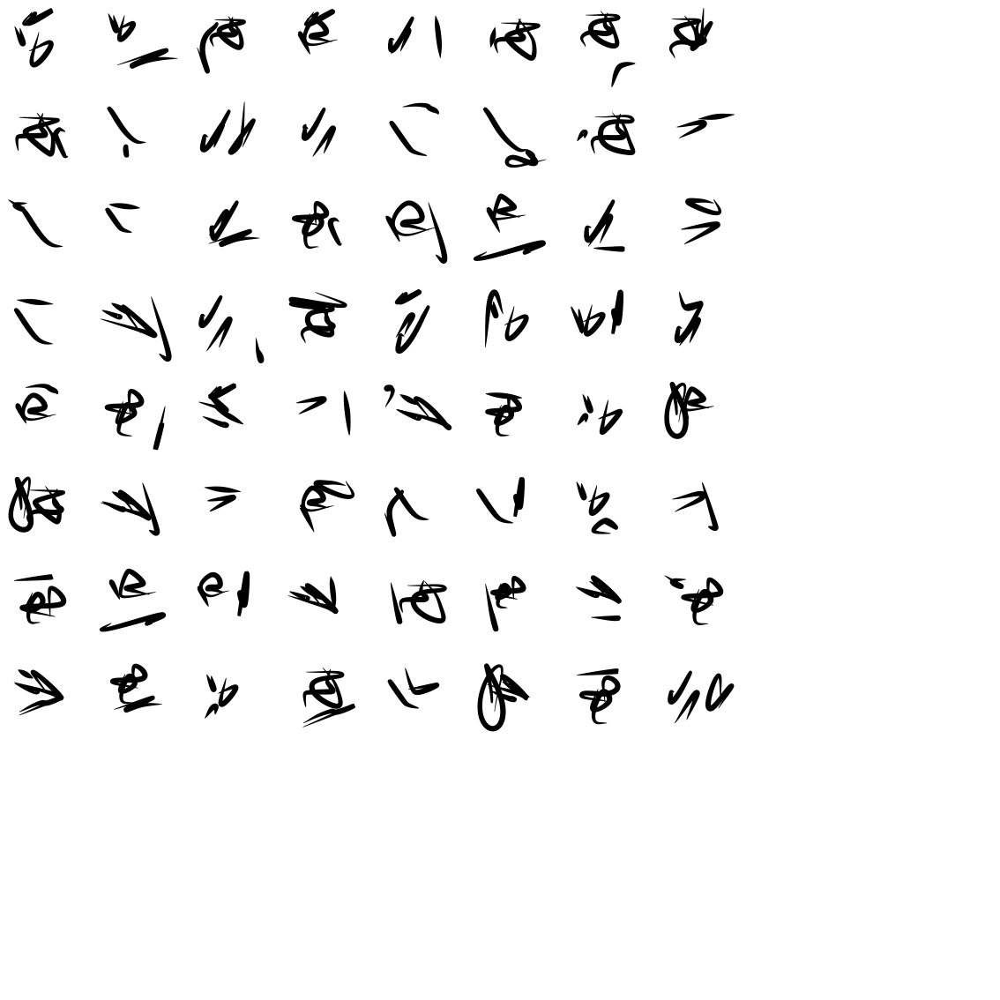

In [277]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 300
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 255))
grid_n = 8
grid_size = size / grid_n
for i in range(grid_n):
    for j in range(grid_n):
        char_multi_strokes = make_char_2()
#         print(char_multi_strokes)
        for stroke in char_multi_strokes:
            radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(3 + i * grid_size, 3 + j * grid_size)
            poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
            poly = figure.polygon(poly)
            page.place(poly)
        
show(page)

And chars with three radicals:

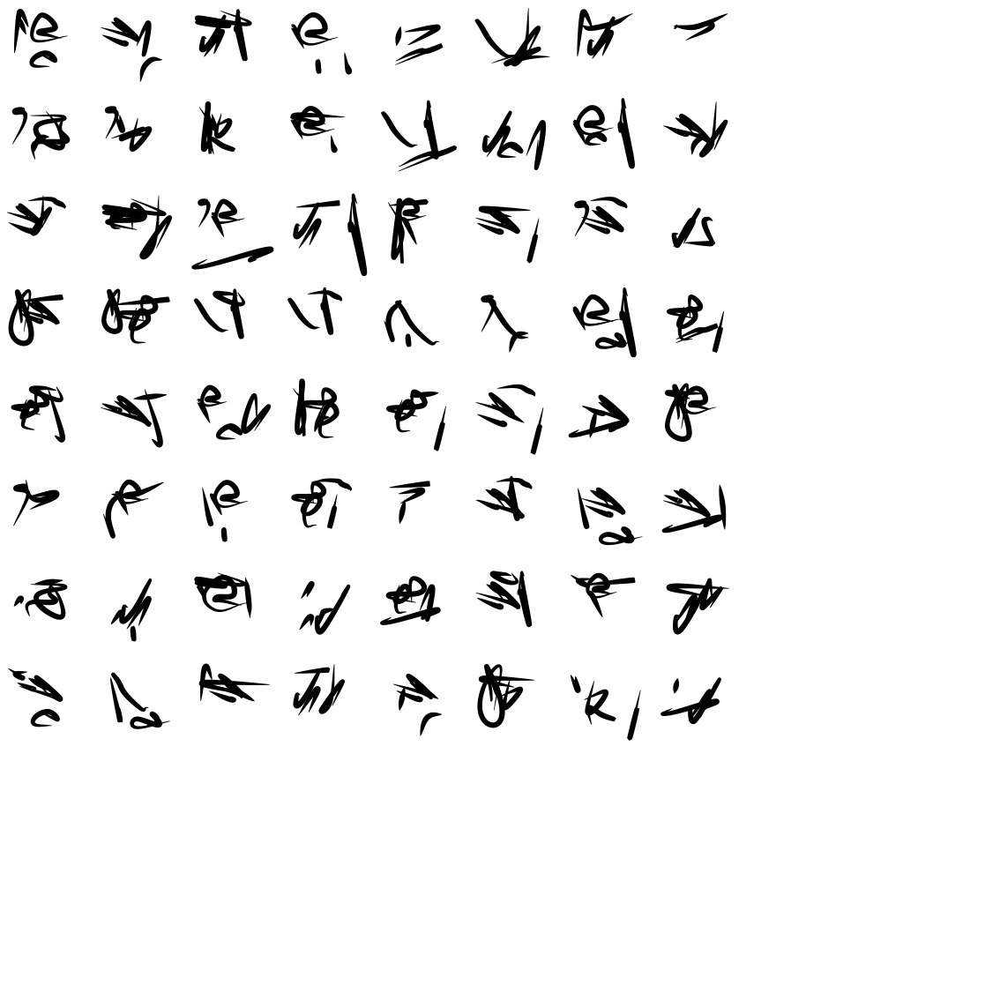

In [278]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 300
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 255))
grid_n = 8
grid_size = size / grid_n
for i in range(grid_n):
    for j in range(grid_n):
        char_multi_strokes = make_char_3()
#         print(char_multi_strokes)
        for stroke in char_multi_strokes:
            radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(3 + i * grid_size, 3 + j * grid_size)
            poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
            poly = figure.polygon(poly)
            page.place(poly)
        
show(page)

Then putting them together and adding a little bit of alpha to mimic the effect of ink.

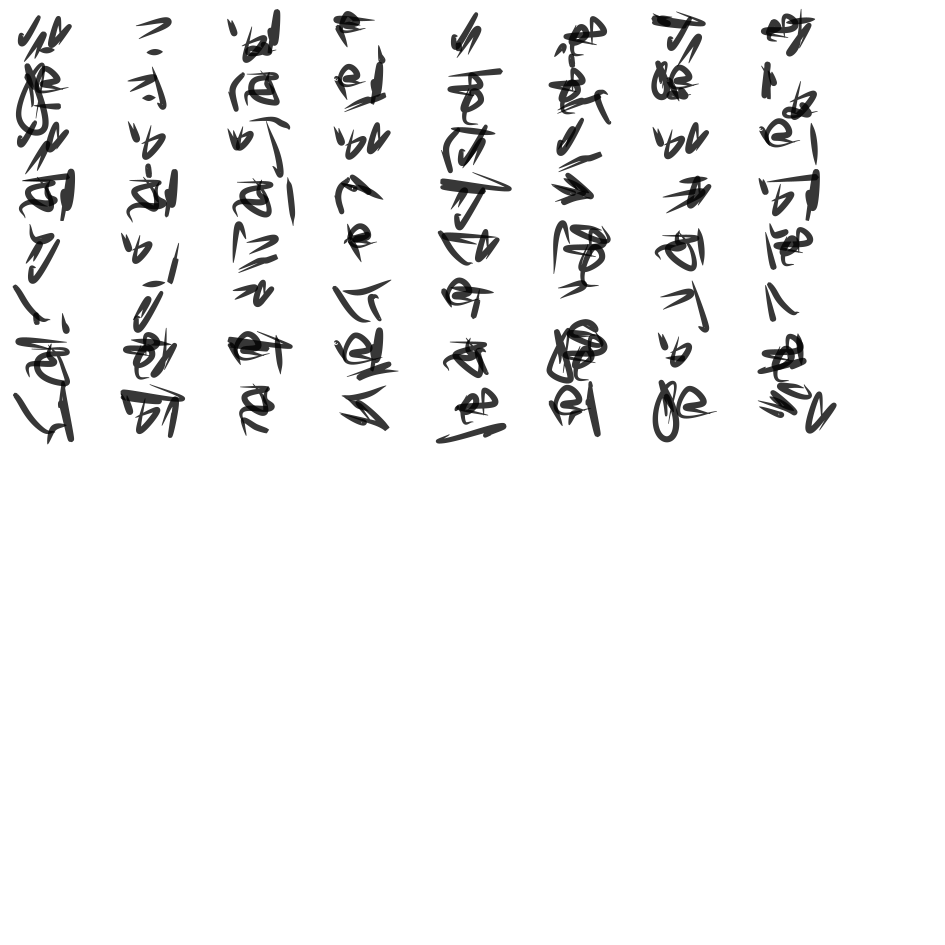

In [279]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 250
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 200))
grid_n = 8
grid_size = size / grid_n
for i in range(grid_n):
    for j in range(grid_n):
        idx = randint(1, 3)
        if idx == 0:
            char_multi_strokes = make_char_1()
        elif idx == 1:
            char_multi_strokes = make_char_2()
        else:
            char_multi_strokes = make_char_3()
        for stroke in char_multi_strokes:
            radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(5 + i * grid_size * 1.2, 3 + j * grid_size * 0.6)
            poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
            poly = figure.polygon(poly)
            page.place(poly)
        
show(page)

Then make a composition by randomly combining some of the two characters in a column into a word, and adding empty space as punctuations.

In [218]:
def make_char_123():
    char_multi_strokes = []
    char_type = randint(3)
    if idx == 0:
        char_multi_strokes = make_char_1()
    elif idx == 1:
        char_multi_strokes = make_char_2()
    else:
        char_multi_strokes = make_char_3()
    return char_multi_strokes

In [138]:
def make_word_vertical(char1, char2):
    word_strokes = []
    
    # put everything of the first char into the word except the last stroke
    for idx in range(len(char1)):
        if idx == len(char1) - 1:
            continue
        else:
            word_strokes.append(char1[idx])
        
    # translate the second char to one char unit below the first char
    trans_char2 = [ stroke.translate(0, 1) for stroke in char2]
    
    # connect the last stroke of the first char with the beginning of the second char
    connected_stroke = char1[-1] + trans_char2[0]
    word_strokes.append(connected_stroke)
    
    # put everything else in the second char into the word
    if len(trans_char2) > 1:
        for idx in range(1, len(trans_char2)):
            word_strokes.append(trans_char2[idx])

    return word_strokes


In [219]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 250
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 200))
grid_n = 8
grid_size = size / grid_n

skip_char_idx = -1

for i in range(grid_n):
    for j in range(grid_n * 2):
        char_count = i * grid_n + j
        
        if char_count == skip_char_idx: #skip this char if it has been written together with the one above it
            continue
        
        if char_count % randint(7, 12) == 0: #add some random punctuation space, creating a feeling of a sentence
            continue
        
        if randint(10) > 6: #connect 30% of the chars as a two-chars word
            char_multi_strokes_1 = make_char_123()
            char_multi_strokes_2 = make_char_123()
            
            word = make_word_vertical(char_multi_strokes_1, char_multi_strokes_2)
            skip_char_idx = char_count + 1 #skip the next char

            for stroke in word:
                radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(5 + i * grid_size * 1.2, 3 + j * grid_size * 0.7)
                poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
                poly = figure.polygon(poly)
                page.place(poly)
        
        else:
            char_multi_strokes = make_char_123()

            for stroke in char_multi_strokes:
                radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(5 + i * grid_size * 1.2, 3 + j * grid_size * 0.7)
                poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
                poly = figure.polygon(poly)
                page.place(poly)
        
show(page)

Now it looks more like a paragraph of vertically written text.

## -------------- 03/31/2020 update --------------

Although the writings generated above looks smooth, the points of the characters are a bit too cramped in many local parts of the radical. So I made an update by using K-Means Clustering following [this amazing notebook made by Allison](https://github.com/aparrish/material-of-language/blob/master/kmeans-glyphs.ipynb):

In [144]:
from sklearn.cluster import MiniBatchKMeans

In [175]:
def make_radical_kmeans(x_norms, y_norms, num_pts_norms):
    pts = []
    for i in range(500):
        x = t_normal(*x_norms)
        y = t_normal(*y_norms)
        pts.append([x, y])

    km = MiniBatchKMeans(n_clusters=int(t_normal(*num_pts_norms)), max_iter=25)
    km.fit(pts)
    np.random.shuffle(km.cluster_centers_)
    
    return Polyline(km.cluster_centers_)

def make_radical_multi_kmeans(x_norms, y_norms, num_pts_norms, num_strokes):
    p_lines = []
    for i in range(num_strokes):
        pts = []
        for i in range(500):
            x = t_normal(*x_norms)
            y = t_normal(*y_norms)
            pts.append([x, y])

        km = MiniBatchKMeans(n_clusters=int(t_normal(*num_pts_norms)), max_iter=25)
        km.fit(pts)
        np.random.shuffle(km.cluster_centers_)
        p_lines.append(Polyline(km.cluster_centers_))
    
    return p_lines

In [234]:
sa_center_multi_kmeans = [make_radical_multi_kmeans((0.1, 0.9, 0.5, 0.5), (0.1, 0.9, 0.5, 0.5), (2, 8, 5, 2), randint(1, 3)) for i in range(12)]
sa_left_radicals_multi_kmeans = [scale_shift_radical_multi(sa, 0.9, -0.1, 0) for sa in sa_center_multi]
sa_right_radicals_multi_kmeans = [scale_shift_radical_multi(sa, 0.9, 0.1, 0) for sa in sa_center_multi]
sa_top_radicals_multi_kmeans = [scale_shift_radical_multi(sa, 0.9, 0, -0.1) for sa in sa_center_multi]
sa_bottom_radicals_multi_kmeans = [scale_shift_radical_multi(sa, 0.9, 0, 0.1) for sa in sa_center_multi]

In [246]:
def make_char_1_kmeans():
    return choice(sa_center_multi_kmeans)

def make_char_2_kmeans():
    comb = randint(0, 4)
    switcher = {
                0: [choice(left_radicals)] + choice(sa_right_radicals_multi_kmeans),
                1: choice(sa_left_radicals_multi_kmeans) + [choice(right_radicals)],
                2: [choice(top_radicals)] + choice(sa_bottom_radicals_multi_kmeans),
                3: choice(sa_top_radicals_multi_kmeans) + [choice(bottom_radicals)]
                }
    return switcher.get(comb)

def make_char_3_kmeans():
    comb = randint(0, 4)
    switcher = {
                0: [choice(top_radicals)] + [choice(left_radicals)] + choice(sa_right_radicals_multi_kmeans),
                1: [choice(top_radicals)] + choice(sa_left_radicals_multi_kmeans) + [choice(right_radicals)],
                2: [choice(left_radicals)] + choice(sa_right_radicals_multi_kmeans) + [choice(bottom_radicals)],
                3: choice(sa_left_radicals_multi_kmeans) + [choice(right_radicals)] + [choice(bottom_radicals)]
                }
    return switcher.get(comb)

def make_char_123_kmeans():
    char_multi_strokes = []
    char_type = randint(6)
    if idx < 1:
        char_multi_strokes = make_char_1_kmeans()
    elif idx < 4:
        char_multi_strokes = make_char_2_kmeans()
    else:
        char_multi_strokes = make_char_3_kmeans()
    return char_multi_strokes

Testing with a single radical:

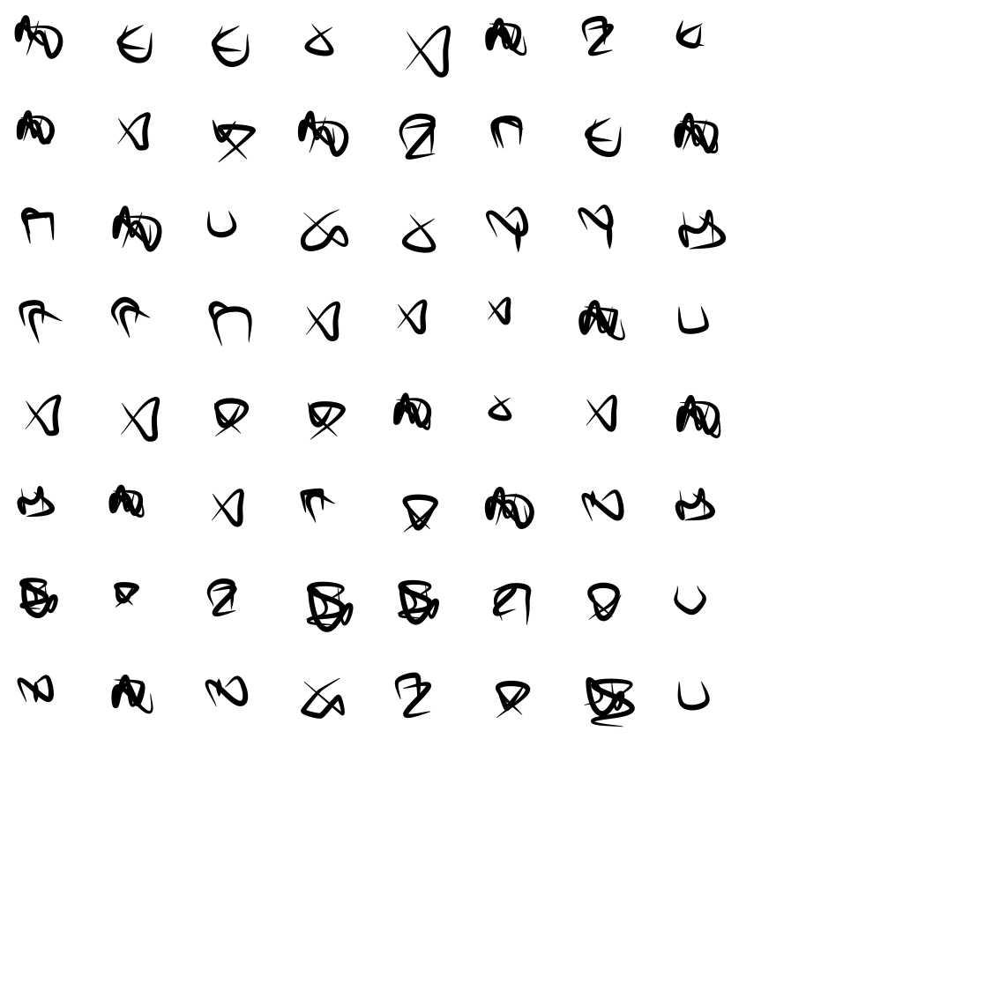

In [235]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 300
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 255))
grid_n = 8
grid_size = size / grid_n
for i in range(grid_n):
    for j in range(grid_n):
        char_multi_strokes = make_char_1_kmeans()
#         print(char_multi_strokes)
        for stroke in char_multi_strokes:
            radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(3 + i * grid_size, 3 + j * grid_size)
            poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
            poly = figure.polygon(poly)
            page.place(poly)
        
show(page)

And finally, re-generate the composition:

In [280]:
thicknesses = (np.sin(np.linspace(0, np.pi, 100))+0.1) * 2
size = 250
d = document(size, size, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 200))
grid_n = 8
grid_size = size / grid_n

skip_char_idx = -1

for i in range(grid_n):
    for j in range(grid_n * 2):
        char_count = i * grid_n + j
        
        if char_count == skip_char_idx: #skip this char if it has been written together with the one above it
            continue
        
        if char_count % randint(7, 12) == 0: #add some random punctuation space, creating a feeling of a sentence
            continue
        
        if randint(10) > 6: #connect 30% of the chars as a two-chars word
            char_multi_strokes_1 = make_char_123_kmeans()
            char_multi_strokes_2 = make_char_123_kmeans()
            
            word = make_word_vertical(char_multi_strokes_1, char_multi_strokes_2)
            skip_char_idx = char_count + 1 #skip the next char

            for stroke in word:
                radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(5 + i * grid_size * 1.2, 3 + j * grid_size * 0.7)
                poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
                poly = figure.polygon(poly)
                page.place(poly)
        
        else:
            char_multi_strokes = make_char_123_kmeans()

            for stroke in char_multi_strokes:
                radical_pline = stroke.scale(grid_size * normal(0.67, 0.1)).translate(5 + i * grid_size * 1.2, 3 + j * grid_size * 0.7)
                poly = radical_pline.augment().fancy_curve(samples_per=54, thicknesses=thicknesses, tightness=normal(-0.5, 0.5))
                poly = figure.polygon(poly)
                page.place(poly)
        
show(page)